<a href="https://colab.research.google.com/github/ChiriKamau/limaAI/blob/main/notebooks/yolo_model(v2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

!pip install ultralytics opencv-python -q
from google.colab import drive
drive.mount('/content/drive')


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.0 MB/s eta 0:00:00
Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import os
import shutil
from PIL import Image as PILImage
from sklearn.model_selection import train_test_split



In [ ]:
#CSV paths and their corresponding image directories (modify these as needed)
csv_image_mapping = [
    {
        'csv_path': '/content/drive/MyDrive/Tomato_dataset/phone1(ripe)/phone1(ripe).csv',
        'image_dir': '/content/drive/MyDrive/Tomato_dataset/phone1(ripe)'
    },
    {
        'csv_path': '/content/drive/MyDrive/Tomato_dataset/Phone1(green)/phone1(green).csv',
        'image_dir': '/content/drive/MyDrive/Tomato_dataset/Phone1(green)'
    },
    {
        'csv_path': '/content/drive/MyDrive/Tomato_dataset/phone2(batch1)/annotations/phone2(batch1).csv',
        'image_dir': '/content/drive/MyDrive/Tomato_dataset/phone2(batch1)'
    },
    {
        'csv_path': '/content/drive/MyDrive/Tomato_dataset/phone2(batch2)/annotations/phone2(batch2).csv',
        'image_dir': '/content/drive/MyDrive/Tomato_dataset/phone2(batch2)'
    },
    {
        'csv_path': '/content/drive/MyDrive/Tomato_dataset/phone2(batch3)/annotations/phone2(batch3).csv',
        'image_dir': '/content/drive/MyDrive/Tomato_dataset/phone2(batch3)'
    },
    {
        'csv_path': '/content/drive/MyDrive/Tomato_dataset/phone2(batch4)/annotations/phone2(batch4).csv',
        'image_dir': '/content/drive/MyDrive/Tomato_dataset/phone2(batch4)'
    },
    {
        'csv_path': '/content/drive/MyDrive/Tomato_dataset/phone2(batch5)/annotations/phone2(batch5).csv',
        'image_dir': '/content/drive/MyDrive/Tomato_dataset/phone2(batch5)'
    },
    {
        'csv_path': '/content/drive/MyDrive/Tomato_dataset/camera_ripe(batch1)/annotations/camera_ripe(batch1).csv',
        'image_dir': '/content/drive/MyDrive/Tomato_dataset/camera_ripe(batch1)'
    },
    {
        'csv_path': '/content/drive/MyDrive/Tomato_dataset/camera_ripe(batch2)/annotations/camera_ripe(batch2).csv',
        'image_dir': '/content/drive/MyDrive/Tomato_dataset/camera_ripe(batch2)'
    },
    {
        'csv_path': '/content/drive/MyDrive/Tomato_dataset/camera_ripe(batch3)/annotations/camera_ripe(batch3).csv',
        'image_dir': '/content/drive/MyDrive/Tomato_dataset/camera_ripe(batch3)'
    }
]

In [ ]:
# Get annotated image names from CSVs
annotated_images = set()
for mapping in csv_image_mapping:
    try:
        df = pd.read_csv(mapping['csv_path'])
        annotated_images.update(df['image_name'].unique())
    except Exception as e:
        print(f"Error reading {mapping['csv_path']}: {e}")

# Get all images from directories
all_images = set()
for mapping in csv_image_mapping:
    try:
        images = [f for f in os.listdir(mapping['image_dir']) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        all_images.update(images)
    except Exception as e:
        print(f"Error accessing {mapping['image_dir']}: {e}")

# Calculate annotated and unannotated counts
unannotated_images = all_images - annotated_images
print(f"Annotated images: {len(annotated_images)}")
print(f"Unannotated images: {len(unannotated_images)}")
if unannotated_images:
    print("Unannotated images:", unannotated_images)

Annotated images: 563
Unannotated images: 225
Unannotated images: {'IMG_20250904_140013_HDR.jpg', 'IMG_20250905_134858.jpg', 'IMG_20250905_151405.jpg', 'IMG_20250904_144830_HDR.jpg', 'IMG_20250904_144633 - Copy.jpg', 'IMG_20250904_143550.jpg', 'IMG_20250905_135804.jpg', 'IMG_20250904_145600.jpg', 'IMG_20250904_145752.jpg', 'IMG_20250904_145501_HDR.jpg', 'IMG_20250904_144632 - Copy.jpg', 'IMG_20250904_145254 - Copy.jpg', 'IMG_20250904_145350.jpg', 'IMG_20250904_144358.jpg', 'IMG_20250904_145122.jpg', 'IMG_20250904_144211.jpg', 'IMG_20250904_145318.jpg', 'IMG_20250904_144704.jpg', 'IMG_20250904_145528.jpg', 'IMG_20250905_151115.jpg', 'IMG_20250905_151357.jpg', 'IMG_20250904_144706.jpg', 'IMG_20250904_144556.jpg', 'IMG_20250904_144324.jpg', 'IMG_20250904_144450.jpg', 'IMG_20250904_144254.jpg', 'IMG_20250904_144955.jpg', 'IMG_20250905_151045.jpg', 'IMG_20250904_144229.jpg', 'IMG_20250904_144431.jpg', 'IMG_20250904_145717.jpg', 'IMG_20250905_151927.jpg', 'IMG_20250904_135226.jpg', 'IMG_2025

In [ ]:


# Read and process each CSV
dfs = []
for mapping in csv_image_mapping:
    try:
        df = pd.read_csv(mapping['csv_path'])
        df['image_dir'] = mapping['image_dir']  # Add image_dir column
        dfs.append(df)
    except Exception as e:
        print(f"Error reading {mapping['csv_path']}: {e}")
        raise

# Concatenate DataFrames in memory for processing (not saving)
data = pd.concat(dfs, ignore_index=True)

# Ensure correct columns
expected_columns = ['image_name', 'label_name', 'bbox_x', 'bbox_y', 'bbox_width', 'bbox_height', 'image_width', 'image_height', 'image_dir']
data = data[expected_columns]

# Check for missing or invalid label_name values
print("Missing label_name values:", data['label_name'].isna().sum())
print("Unique label_name values:", data['label_name'].unique())
data = data.dropna(subset=['label_name'])
data = data[data['label_name'].apply(lambda x: isinstance(x, str))]

# Extract binary class (G or R)
data['binary_class'] = data['label_name'].apply(lambda x: x.split('.')[0])
print("Unique binary classes:", data['binary_class'].unique())
if not all(label in ['G', 'R'] for label in data['binary_class'].unique()):
    print("Warning: Unexpected binary classes:", data['binary_class'].unique())

# Check class balance
print("Class distribution:")
print(data['binary_class'].value_counts())

# Validate bounding boxes
invalid_bboxes = data[
    (data['bbox_width'] <= 0) |
    (data['bbox_height'] <= 0) |
    (data['bbox_x'] < 0) |
    (data['bbox_y'] < 0) |
    (data['bbox_x'] + data['bbox_width'] > data['image_width']) |
    (data['bbox_y'] + data['bbox_height'] > data['image_height'])
]
if not invalid_bboxes.empty:
    print("Invalid bounding boxes:", invalid_bboxes[['image_name', 'bbox_x', 'bbox_y', 'bbox_width', 'bbox_height']])
    data = data[~data.index.isin(invalid_bboxes.index)]

# Get unique filenames and split into train/val
unique_filenames = data['image_name'].unique()
train_filenames, val_filenames = train_test_split(unique_filenames, test_size=0.2, random_state=42)

# Create dataset directories
dataset_dir = '/content/dataset'
images_train_dir = os.path.join(dataset_dir, 'images', 'train')
images_val_dir = os.path.join(dataset_dir, 'images', 'val')
labels_train_dir = os.path.join(dataset_dir, 'labels', 'train')
labels_val_dir = os.path.join(dataset_dir, 'labels', 'val')
os.makedirs(images_train_dir, exist_ok=True)
os.makedirs(images_val_dir, exist_ok=True)
os.makedirs(labels_train_dir, exist_ok=True)
os.makedirs(labels_val_dir, exist_ok=True)

# Class mapping
class_map = {'G': 0, 'R': 1}

In [ ]:
# Create YOLO label file
def create_yolo_label(filename, split_dir, is_train=True):
    annotations = data[data['image_name'] == filename]
    if annotations.empty:
        print(f"No annotations for {filename}")
        return False

    image_dir = annotations['image_dir'].iloc[0]
    image_path = os.path.join(image_dir, filename)
    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        return False

    width = annotations['image_width'].iloc[0]
    height = annotations['image_height'].iloc[0]
    dest_image_dir = images_train_dir if is_train else images_val_dir
    dest_image_path = os.path.join(dest_image_dir, filename)
    shutil.copy(image_path, dest_image_path)

    label_path = os.path.join(labels_train_dir if is_train else labels_val_dir, filename.replace('.jpg', '.txt'))
    valid_annotations = 0
    with open(label_path, 'w') as f:
        for _, ann in annotations.iterrows():
            cls = class_map[ann['binary_class']]
            x_center = (ann['bbox_x'] + ann['bbox_width'] / 2) / width
            y_center = (ann['bbox_y'] + ann['bbox_height'] / 2) / height
            w = ann['bbox_width'] / width
            h = ann['bbox_height'] / height
            if 0 <= x_center <= 1 and 0 <= y_center <= 1 and 0 < w <= 1 and 0 < h <= 1:
                f.write(f"{cls} {x_center:.6f} {y_center:.6f} {w:.6f} {h:.6f}\n")
                valid_annotations += 1
            else:
                print(f"Skipping invalid bbox for {filename}: {x_center}, {y_center}, {w}, {h}")
    print(f"Created label file: {label_path} with {valid_annotations} annotations")
    return valid_annotations > 0

In [ ]:
# Create labels and oversample minority class
train_success = []
val_success = []
for filename in train_filenames:
    train_success.append(create_yolo_label(filename, 'train', is_train=True))
ripe_images = data[data['binary_class'] == 'R']['image_name'].unique()
for filename in ripe_images:
    if filename in train_filenames:
        train_success.append(create_yolo_label(filename, 'train', is_train=True))
for filename in val_filenames:
    val_success.append(create_yolo_label(filename, 'val', is_train=False))

# Verify dataset
print(f"Train images: {len(os.listdir(images_train_dir))} in {images_train_dir}")
print(f"Val images: {len(os.listdir(images_val_dir))} in {images_val_dir}")
print(f"Train labels: {len(os.listdir(labels_train_dir))} in {labels_train_dir}")
print(f"Val labels: {len(os.listdir(labels_val_dir))} in {labels_val_dir}")
print(f"Dataset prepared with {sum(train_success)} train images and {sum(val_success)} val images with valid annotations.")

In [ ]:
# Check a sample label file
sample_label = os.path.join(labels_train_dir, 'IMG_20250904_143547.txt')
if os.path.exists(sample_label):
    with open(sample_label, 'r') as f:
        print(f"Sample label file {sample_label}:\n{f.read()}")

In [ ]:
# Cell 3: Create data.yaml for YOLO
import os

yaml_content = """
train: /content/dataset/images/train
val: /content/dataset/images/val

nc: 2
names: ['green', 'ripe']
"""

yaml_path = '/content/data.yaml'
with open(yaml_path, 'w') as f:
    f.write(yaml_content)

# Verify data.yaml creation
if os.path.exists(yaml_path):
    print(f"data.yaml created at {yaml_path}")
    with open(yaml_path, 'r') as f:
        print("data.yaml content:\n", f.read())
else:
    print(f"Failed to create data.yaml at {yaml_path}")

### 🏋️ YOLOv8 Model Training and Inference Workflow

This notebook trains a **YOLOv8 medium model** on a tomato dataset and allows inference using either:

1. **PyTorch `.pt` model** (for Colab / Python testing)
2. **TFLite `.tflite` model** (for mobile or edge deployment)

---

#### 1️⃣ Training the YOLOv8 Model

- The training cell uses a pretrained YOLOv8 medium model (`yolov8m.pt`) and fine-tunes it on a custom dataset.
- Key settings include:
  - `imgsz=320` → input image size
  - `epochs=100` → number of training epochs
  - `batch=16` → batch size
  - Data augmentation parameters (`hsv_h`, `hsv_s`, `hsv_v`, `fliplr`, `flipud`, `mosaic`, `mixup`) for better generalization
  - `iou=0.5`, `max_det=90` → detection settings
- **Class weights** were calculated to handle class imbalance but are **not directly applied** in this YOLO version.

**Output:** After training, the model is saved as a `.pt` file (PyTorch format), typically in:



In [ ]:
# Cell 4: Train YOLOv8 Model (Modified)
from ultralytics import YOLO
import os

# Verify data.yaml exists
yaml_path = '/content/data.yaml'
if not os.path.exists(yaml_path):
    print(f"Error: {yaml_path} does not exist")
    raise FileNotFoundError(f"{yaml_path} does not exist")

# Load pretrained YOLOv8 medium model
model = YOLO('yolov8m.pt')

# Calculate class weights to handle imbalance - Note: class weights in dictionary format are not directly supported in the train method arguments in this YOLO version. Consider alternative methods for handling class imbalance if needed.
class_counts = data['binary_class'].value_counts()
total = sum(class_counts)
class_weights = {0: total / (2 * class_counts.get('G', 1)), 1: total / (2 * class_counts.get('R', 1))}

# Train with enhanced settings
results = model.train(
    data=yaml_path,
    epochs=50,  # Increased for convergence
    imgsz=320,
    batch=16,
    augment=True,
    hsv_h=0.4,  # Stronger augmentation
    hsv_s=0.9,
    hsv_v=0.7,
    fliplr=0.5,
    flipud=0.5,
    scale=0.8,
    translate=0.4,
    mosaic=1.0,
    mixup=0.4,
    patience=30,  # Longer patience
    lr0=0.0003,  # Lower learning rate
    iou=0.5,
    max_det=90,  # Higher max detections
    # cls=class_weights  # Apply class weights - Removed as dictionary format is not supported
)

print("Training completed.")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.209 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.4, hsv_s=0.9, hsv_v=0.7, imgsz=320, int8=False, iou=0.5, keras=False, kobj=1.

In [ ]:

save_path = '/content/drive/MyDrive/Tomato_dataset/models/yolov8m_trained.pt'

# Ensure the directory exists
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save the trained model
try:
    model.save(save_path)
    print(f"Model saved to {save_path}")
except Exception as e:
    print(f"Error saving model: {e}")
    raise

Model saved to /content/drive/MyDrive/Tomato_dataset/models/yolov8m_trained.pt


### 🧠 Explanation of YOLO TFLite Export Code

This cell converts the trained YOLO model into **TensorFlow Lite (TFLite)** format so it can run efficiently on mobile or embedded devices.

---

#### **Step-by-step Explanation**

1. **Import OS Module**
   - `import os` allows interaction with the file system — checking paths, creating directories, etc.

2. **Export Model to TFLite**
   - `model.export(format='tflite')` uses YOLO’s built-in exporter to generate a `.tflite` file.
   - The exported file is typically placed in `/content/runs/detect/train/weights/`.

3. **Set Expected TFLite Path**
   - The variable `tflite_path` points to the expected file location:
     ```
     /content/runs/detect/train/weights/best_saved_model/best_float32.tflite
     ```
   - File paths may vary slightly between YOLO versions.

4. **Check and Locate Model File**
   - If the file isn’t found, the script searches all `/content/runs/detect/train*/weights/best_saved_model/`
     directories using `glob.glob()`.
   - This ensures it can still find the correct `.tflite` file even if the training run folder name changes.

5. **Handle Missing File Cases**
   - If found → updates the path and continues.
   - If not found → raises a `FileNotFoundError` and alerts you that export failed.

6. **Confirm Export**
   - Prints the path where the `.tflite` model was successfully exported.

7. **Copy to Google Drive**
   - The command:
     ```
     !cp {tflite_path} /content/drive/MyDrive/Tomato_dataset/model_soma.tflite
     ```
     copies the file to your Google Drive so you can access it later.

---

#### ✅ **Summary**
- Converts YOLO model → TensorFlow Lite format.  
- Searches for and verifies the exported file.  
- Copies the `.tflite` model to Google Drive for storage or deployment.  


### 📝 Understanding YOLO Model Formats and Inference in Colab

This notebook uses a **trained YOLO model** for detecting objects (e.g., tomatoes) in images. It is important to understand the differences between the model formats and how inference is performed.

---

#### 1️⃣ Model Format in This Cell

```python
model = YOLO('/content/runs/detect/train/weights/best.pt')


In [ ]:
from IPython.display import Image as IPImage, display
import cv2
import os

# Define test image paths (modify as needed)
test_images = ['/content/drive/MyDrive/Tomato_dataset/Camera_ripe/WIN_20250905_13_20_47_Pro.jpg']

# Inference function
def test_and_draw_boxes(image_path, output_path, model, conf=0.2, iou=0.4):
    if not os.path.exists(image_path):
        print(f"Error: Image {image_path} not found")
        return
    results = model(image_path, conf=conf, iou=iou, max_det=100)
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            label = model.names[int(box.cls[0])]
            conf = float(box.conf[0])
            color = (0, 255, 0) if label.startswith('G') else (255, 0, 0)
            cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
            cv2.putText(img, f"{label} {conf:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    cv2.imwrite(output_path, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    print(f"Output saved to {output_path}")
    display(IPImage(output_path))

In [ ]:
model_path = '/content/runs/detect/train/weights/best.pt'

# Load model
model = YOLO(model_path)

# Run inference (assumes test_and_draw_boxes and test_images are defined)
for i, img_path in enumerate(test_images):
    test_and_draw_boxes(img_path, f'/content/output_train_best_{i}.jpg', model)

Error: Image /content/drive/MyDrive/Tomato_dataset/greenhouse_images/image1.jpg/content/drive/MyDrive/Tomato_dataset/Camera_ripe/WIN_20250905_13_20_47_Pro.jpg not found



image 1/1 /content/drive/MyDrive/Tomato_dataset/Camera_ripe/WIN_20250905_13_20_47_Pro.jpg: 192x320 5 greens, 2 ripes, 46.8ms
Speed: 1.0ms preprocess, 46.8ms inference, 1.4ms postprocess per image at shape (1, 3, 192, 320)
Output saved to /content/output_drive_0.jpg


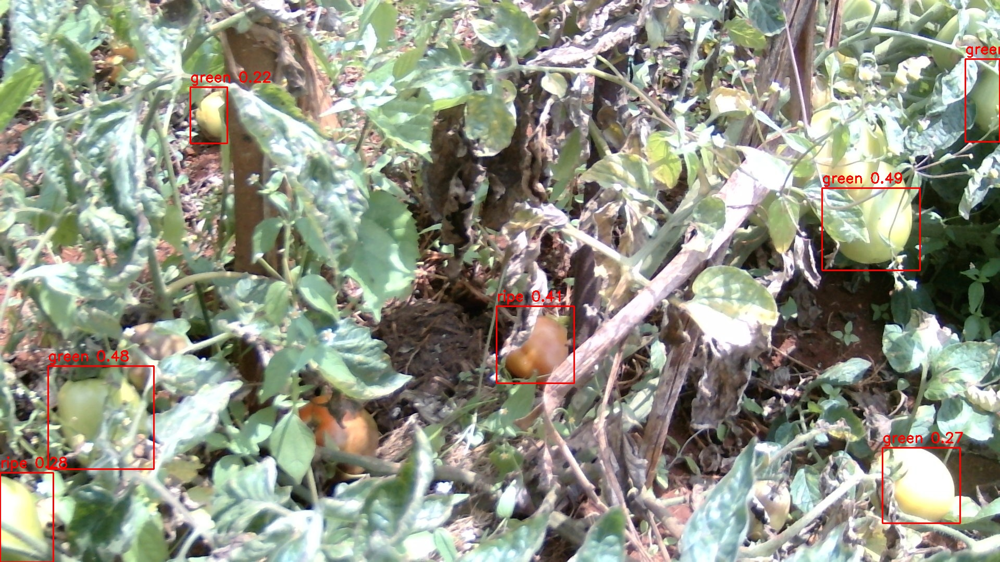

In [ ]:
# Model path
model_path = '/content/drive/MyDrive/Tomato_dataset/models/yolov8m_trained.pt'

# Load model
model = YOLO(model_path)

# Run inference (assumes test_and_draw_boxes and test_images are defined)
for i, img_path in enumerate(test_images):
    test_and_draw_boxes(img_path, f'/content/output_drive_{i}.jpg', model)

In [ ]:
val_results = model.val()
print(val_results)


Ultralytics 8.3.209 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 337.6±345.2 MB/s, size: 5206.2 KB)
val: Scanning /content/dataset/labels/val.cache... 113 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 113/113 211.3Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 0.6it/s 14.5s
                   all        113        899      0.525      0.548      0.495      0.229
                 green        112        698      0.604      0.581      0.555      0.265
                  ripe         65        201      0.446      0.516      0.435      0.194
Speed: 0.6ms preprocess, 7.8ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to /content/runs/detect/val3
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.C

In [ ]:

import shutil

# Define paths
model_name = 'model.V2'
base_save_dir = '/content/drive/MyDrive/Tomato_dataset/models'
save_dir = os.path.join(base_save_dir, model_name)
model_path = os.path.join(save_dir, f'{model_name}.pt')
metrics_path = os.path.join(save_dir, 'results.csv')
run_dir = '/content/runs/detect/train'  # Default YOLOv8 training output directory

# Ensure save directory exists
os.makedirs(save_dir, exist_ok=True)

# Save model weights
try:
    model.save(model_path)
    print(f"Model weights saved to {model_path}")
except Exception as e:
    print(f"Error saving model: {e}")
    raise

# Save training metrics (results.csv)
try:
    results_csv = os.path.join(run_dir, 'results.csv')
    if os.path.exists(results_csv):
        shutil.copy(results_csv, metrics_path)
        print(f"Training metrics saved to {metrics_path}")
    else:
        print(f"Warning: {results_csv} not found")
except Exception as e:
    print(f"Error saving metrics: {e}")

# Save training plots (e.g., confusion_matrix.png, PR_curve.png)
try:
    if os.path.exists(run_dir):
        for file in os.listdir(run_dir):
            if file.endswith(('.png', '.jpg')):
                shutil.copy(os.path.join(run_dir, file), os.path.join(save_dir, file))
        print(f"Training plots saved to {save_dir}")
    else:
        print(f"Warning: {run_dir} not found")
except Exception as e:
    print(f"Error saving plots: {e}")

Model weights saved to /content/drive/MyDrive/Tomato_dataset/models/model.V2/model.V2.pt
Training metrics saved to /content/drive/MyDrive/Tomato_dataset/models/model.V2/results.csv
Training plots saved to /content/drive/MyDrive/Tomato_dataset/models/model.V2


In [ ]:

csv_path = '/content/drive/MyDrive/Tomato_dataset/models/model.V2/results.csv'

# Load and display
df = pd.read_csv(csv_path)
print("Training Metrics:")
display(df.head(10))  # First 10 epochs
print(f"Final mAP@0.5: {df['metrics/mAP50(B)'].iloc[-1]:.4f}")
print(f"Final mAP@0.5:0.95: {df['metrics/mAP50-95(B)'].iloc[-1]:.4f}")

Training Metrics:


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,83.9999,2.63527,2.83073,1.58218,0.22682,0.37710,0.18164,0.06826,2.02010,5.68684,1.24451,0.000467,0.000467,0.000467
1,2,150.6490,2.42431,1.98490,1.38334,0.07954,0.34109,0.05125,0.01749,2.28897,43.34500,1.38493,0.000931,0.000931,0.000931
2,3,221.3690,2.44751,1.99145,1.36503,0.15602,0.30833,0.09922,0.03214,2.38969,inf,1.43862,0.001377,0.001377,0.001377
3,4,295.7310,2.44456,2.01818,1.32878,0.26189,0.32323,0.20581,0.07414,2.12026,2.67854,1.29000,0.001568,0.001568,0.001568
4,5,367.8630,2.44476,2.00092,1.38018,0.11168,0.21809,0.06969,0.02676,2.67780,20.22840,3.59196,0.001535,0.001535,0.001535
5,6,434.3880,2.43849,2.18326,1.36298,0.23290,0.20803,0.14195,0.05165,2.38424,2.41931,1.42087,0.001502,0.001502,0.001502
6,7,504.9640,2.40502,1.94806,1.33614,0.37460,0.44241,0.26968,0.09811,2.05467,1.67488,1.23979,0.001469,0.001469,0.001469
7,8,578.6290,2.39673,1.96514,1.35803,0.26319,0.28639,0.16816,0.05293,2.49583,2.62806,1.42250,0.001436,0.001436,0.001436
8,9,650.3420,2.47833,2.45027,1.31591,0.16190,0.19324,0.08506,0.02662,2.75542,7.92715,1.60285,0.001403,0.001403,0.001403
9,10,722.3350,2.41492,1.95159,1.30233,0.25742,0.34827,0.22897,0.08927,2.23833,2.19775,1.30267,0.001370,0.001370,0.001370


Final mAP@0.5: 0.4937
Final mAP@0.5:0.95: 0.2253


Performance Plots:

BoxP_curve.png:


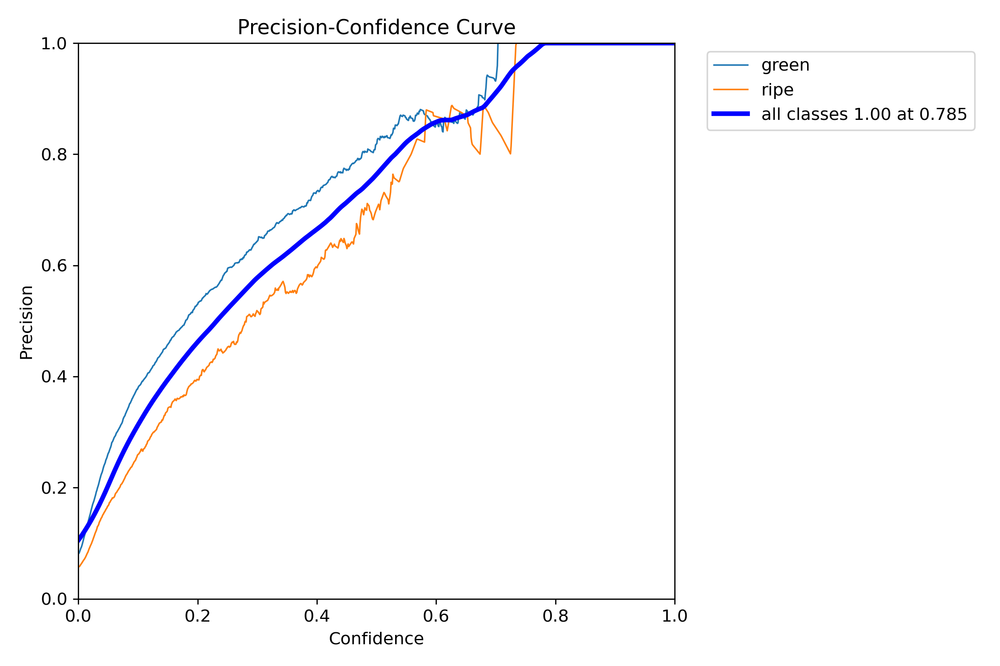


BoxPR_curve.png:


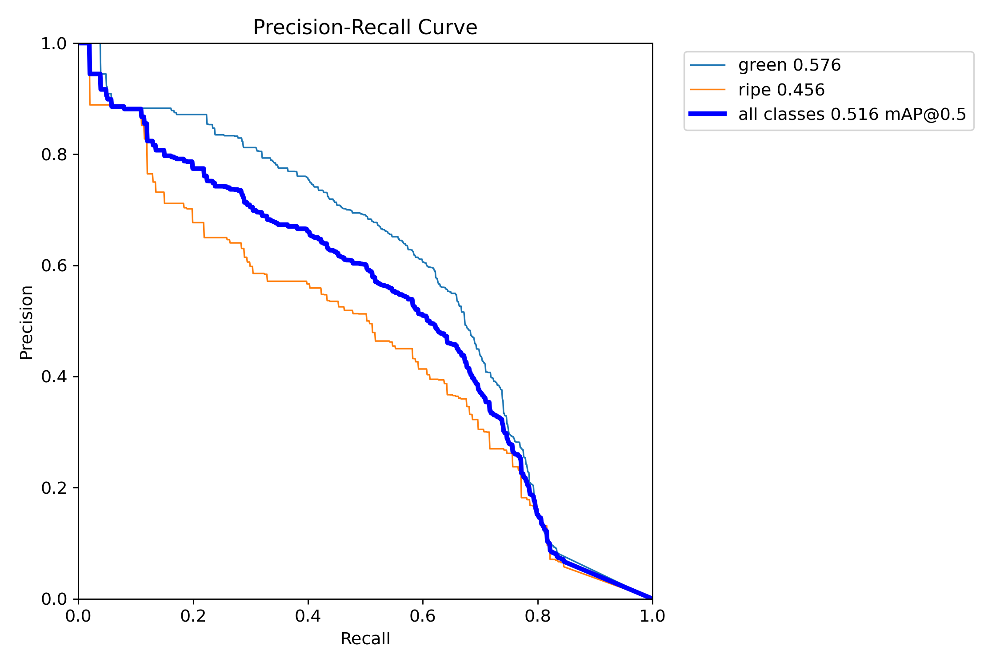


BoxF1_curve.png:


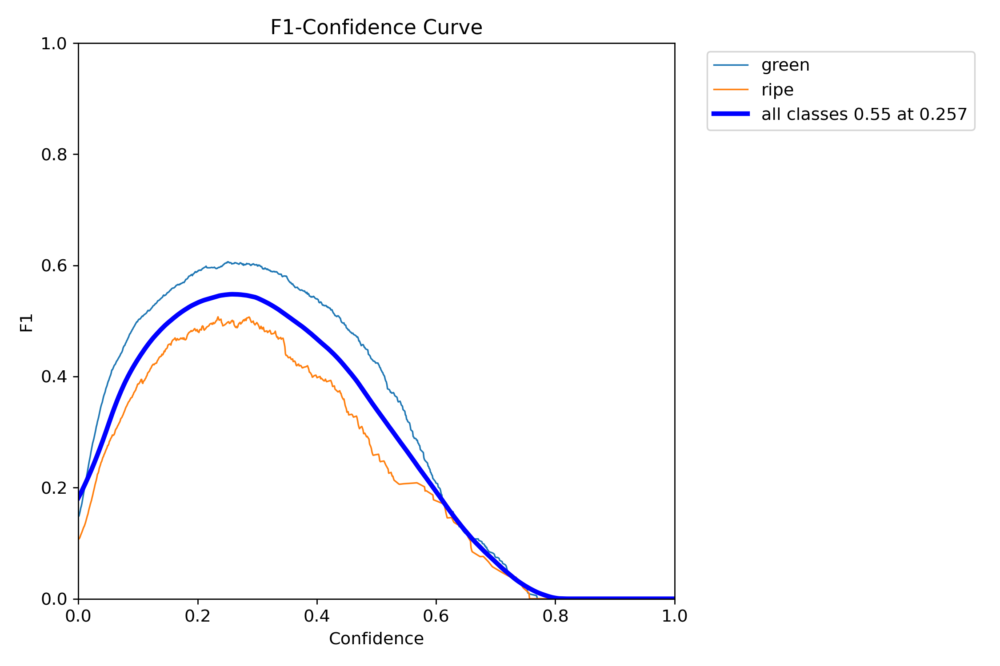


BoxR_curve.png:


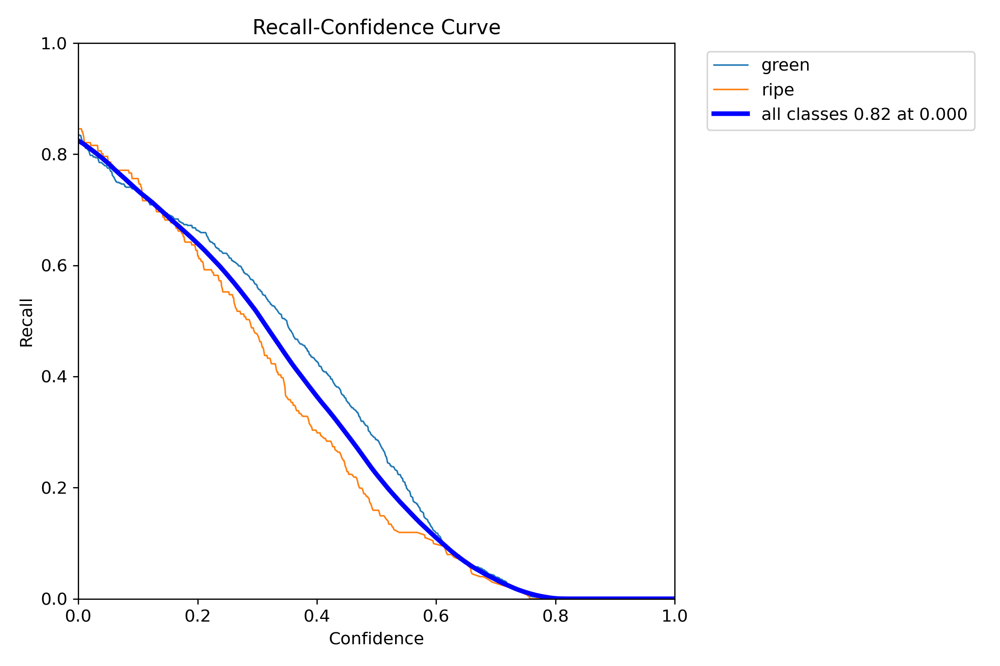


labels.jpg:


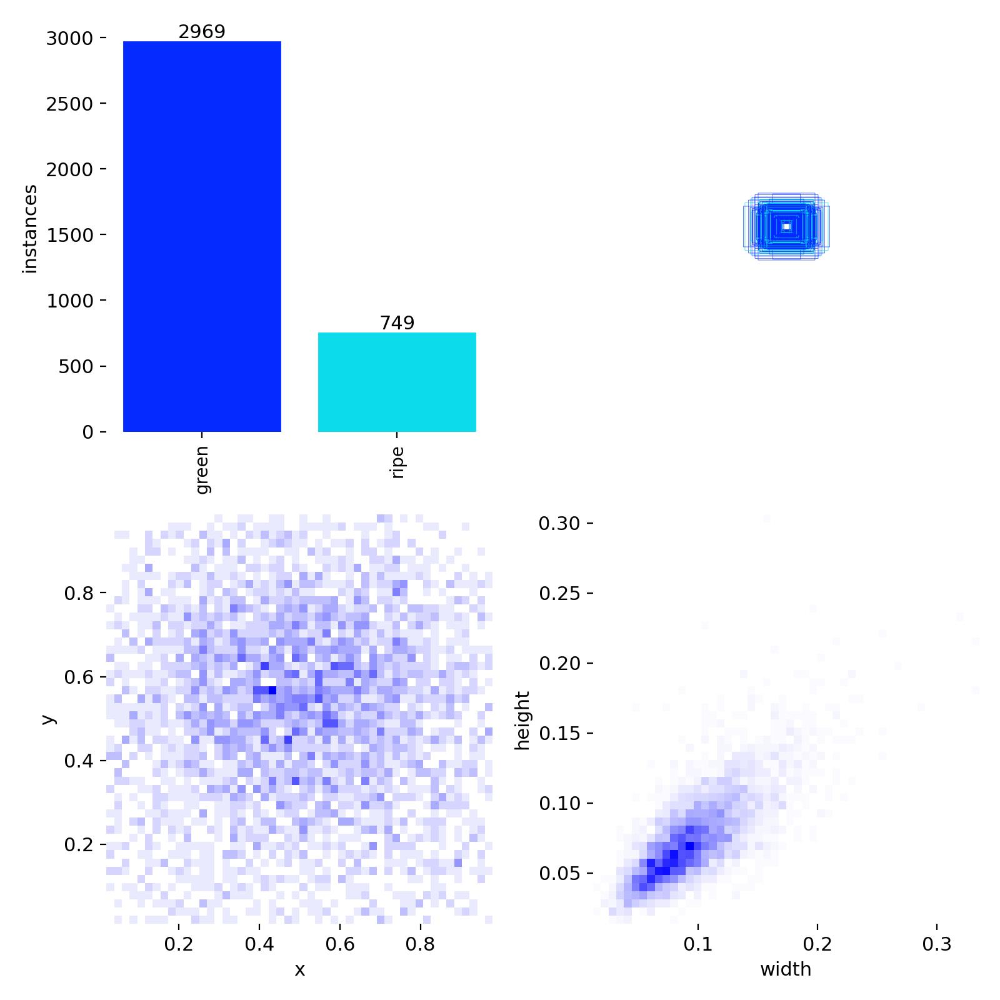


results.png:


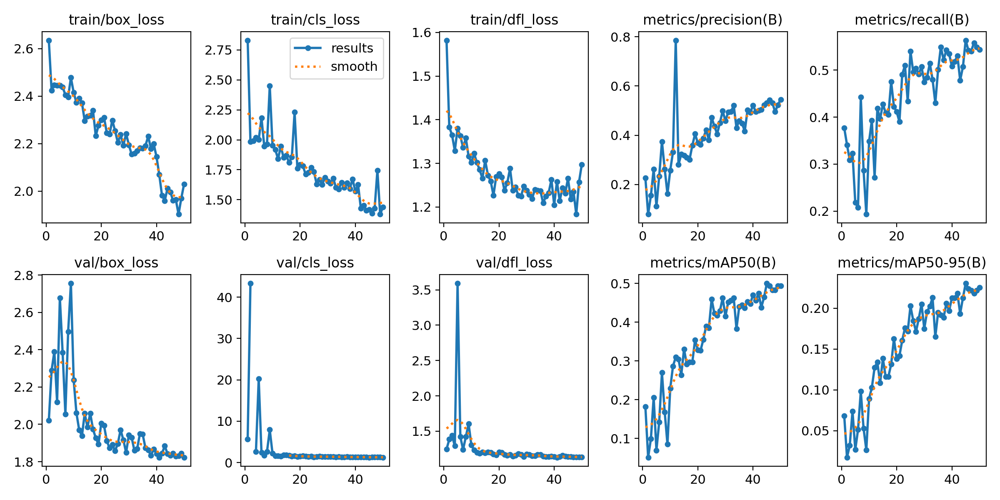


confusion_matrix_normalized.png:


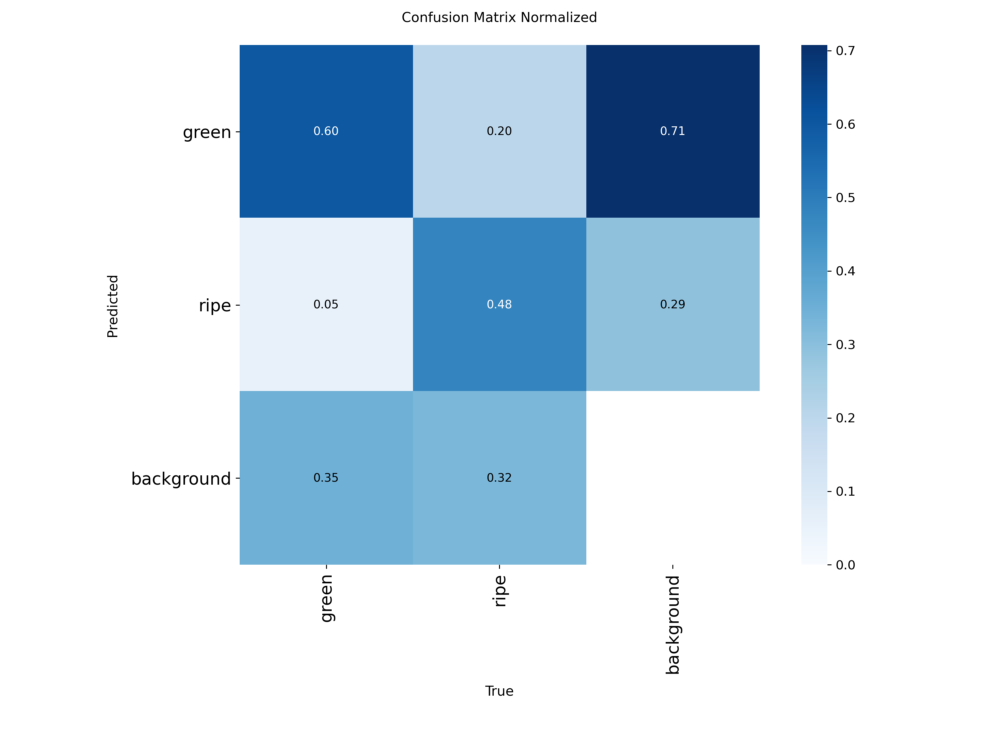


confusion_matrix.png:


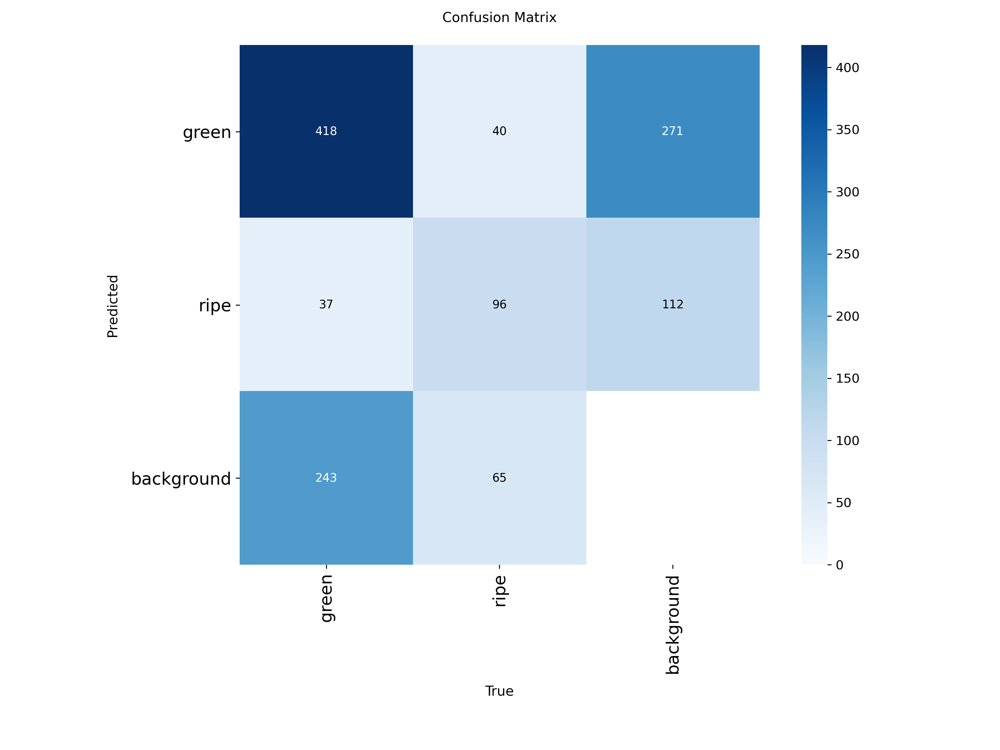

In [ ]:
from IPython.display import Image, display

plots_dir = '/content/drive/MyDrive/Tomato_dataset/models/model.V2'

# Performance plot filenames
perf_plots = ['BoxP_curve.png', 'BoxPR_curve.png', 'BoxF1_curve.png','BoxR_curve.png', 'labels.jpg', 'results.png', 'confusion_matrix_normalized.png','confusion_matrix.png']

# Display performance plots
print("Performance Plots:")
for plot in perf_plots:
    plot_path = os.path.join(plots_dir, plot)
    if os.path.exists(plot_path):
        print(f"\n{plot}:")
        display(Image(plot_path))
    else:
        print(f"\n{plot}: Not found")

Plotting Accuracy and Loss Curves...


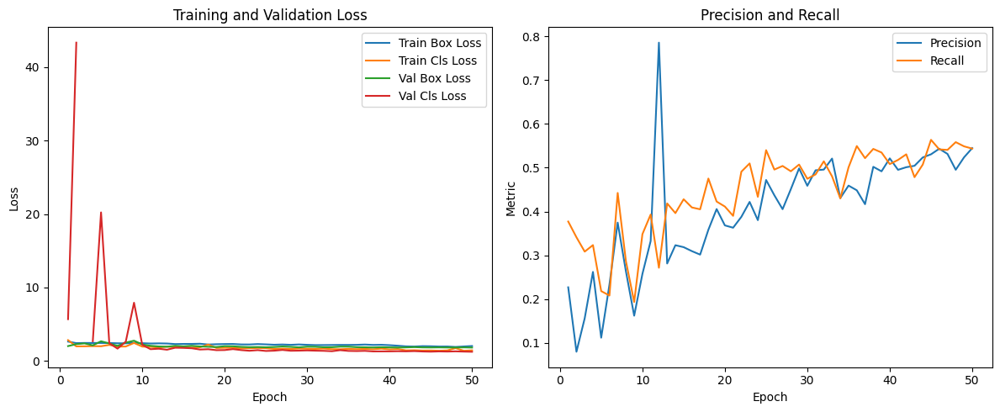

In [ ]:

def plot_accuracy_loss():
    # Load training results from CSV
    results_csv = '/content/drive/MyDrive/Tomato_dataset/models/model.V2/results.csv'
    if not os.path.exists(results_csv):
        raise FileNotFoundError(f"Training results CSV not found at {results_csv}")

    # Read CSV
    df = pd.read_csv(results_csv)

    # Strip whitespace from column names
    df.columns = df.columns.str.strip()

    # Extract relevant columns
    epochs = df['epoch']
    train_box_loss = df['train/box_loss']
    train_cls_loss = df['train/cls_loss']
    val_box_loss = df['val/box_loss']
    val_cls_loss = df['val/cls_loss']
    precision = df['metrics/precision(B)']
    recall = df['metrics/recall(B)']

    # Plot loss
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_box_loss, label='Train Box Loss')
    plt.plot(epochs, train_cls_loss, label='Train Cls Loss')
    plt.plot(epochs, val_box_loss, label='Val Box Loss')
    plt.plot(epochs, val_cls_loss, label='Val Cls Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()

    # Plot accuracy (precision and recall)
    plt.subplot(1, 2, 2)
    plt.plot(epochs, precision, label='Precision')
    plt.plot(epochs, recall, label='Recall')
    plt.xlabel('Epoch')
    plt.ylabel('Metric')
    plt.title('Precision and Recall')
    plt.legend()

    plt.tight_layout()
    plt.show()

print("Plotting Accuracy and Loss Curves...")
plot_accuracy_loss()

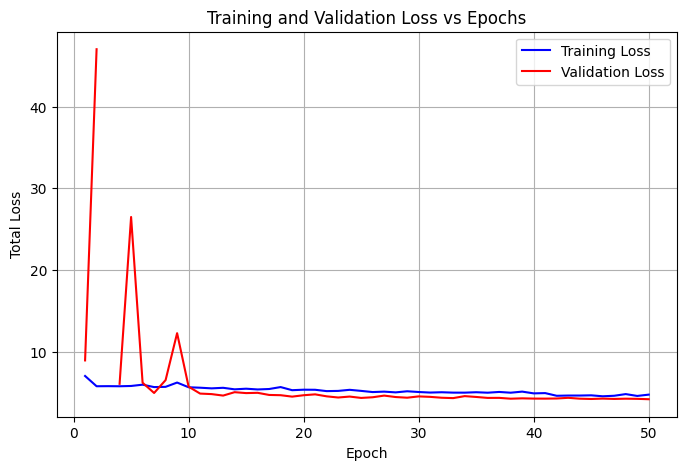

In [ ]:

csv_path = '/content/drive/MyDrive/Tomato_dataset/models/model.V2/results.csv'

# Load data
df = pd.read_csv(csv_path)

# Calculate total losses (sum box + cls + dfl)
df['train_loss'] = df['train/box_loss'] + df['train/cls_loss'] + df['train/dfl_loss']
df['val_loss'] = df['val/box_loss'] + df['val/cls_loss'] + df['val/dfl_loss']

# Plot
plt.figure(figsize=(8, 5))
plt.plot(df['epoch'], df['train_loss'], label='Training Loss', color='blue')
plt.plot(df['epoch'], df['val_loss'], label='Validation Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Total Loss')
plt.title('Training and Validation Loss vs Epochs')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:

csv_path = '/content/drive/MyDrive/Tomato_dataset/models/model.V2/results.csv'

# Load and summarize
df = pd.read_csv(csv_path)
best_epoch = df.loc[df['metrics/mAP50(B)'].idxmax()]
summary = pd.DataFrame({
    'Metric': ['Precision', 'Recall', 'mAP@0.5', 'mAP@0.5:0.95', 'Box Loss', 'Cls Loss'],
    'Value': [
        best_epoch['metrics/precision(B)'],
        best_epoch['metrics/recall(B)'],
        best_epoch['metrics/mAP50(B)'],
        best_epoch['metrics/mAP50-95(B)'],
        best_epoch['train/box_loss'],
        best_epoch['train/cls_loss']
    ]
})
print("Best Epoch Performance:")
display(summary)

Best Epoch Performance:


,Metric,Value
0,Precision,0.53069
1,Recall,0.56379
2,mAP@0.5,0.50022
3,mAP@0.5:0.95,0.23033
4,Box Loss,1.99701
5,Cls Loss,1.41931



results.png:


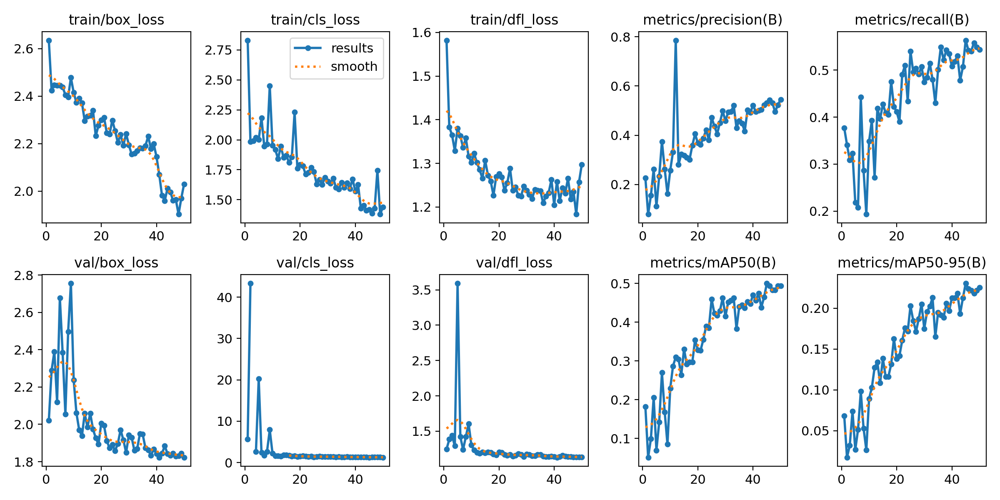


train_batch1161.jpg:


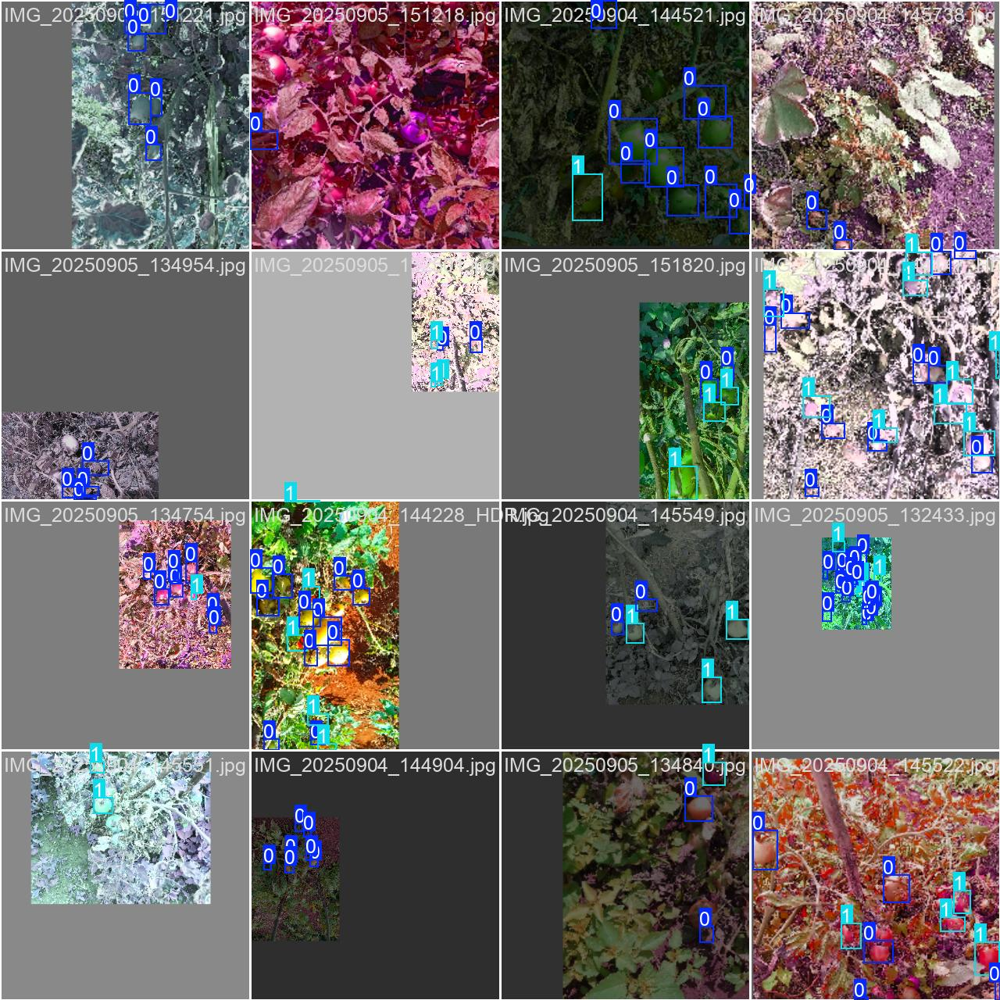


BoxP_curve.png:


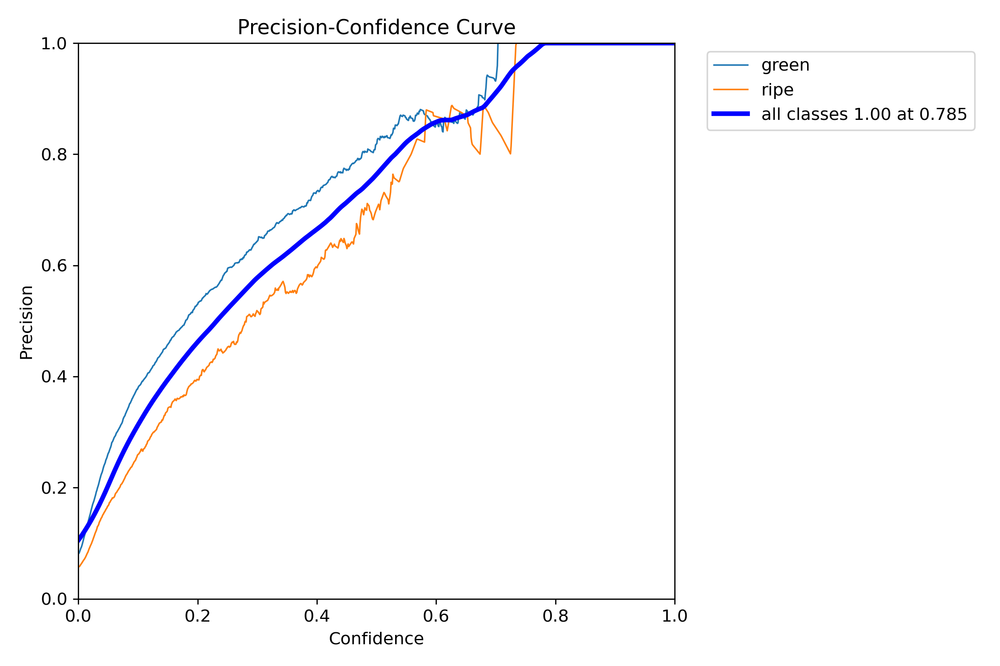


val_batch0_pred.jpg:


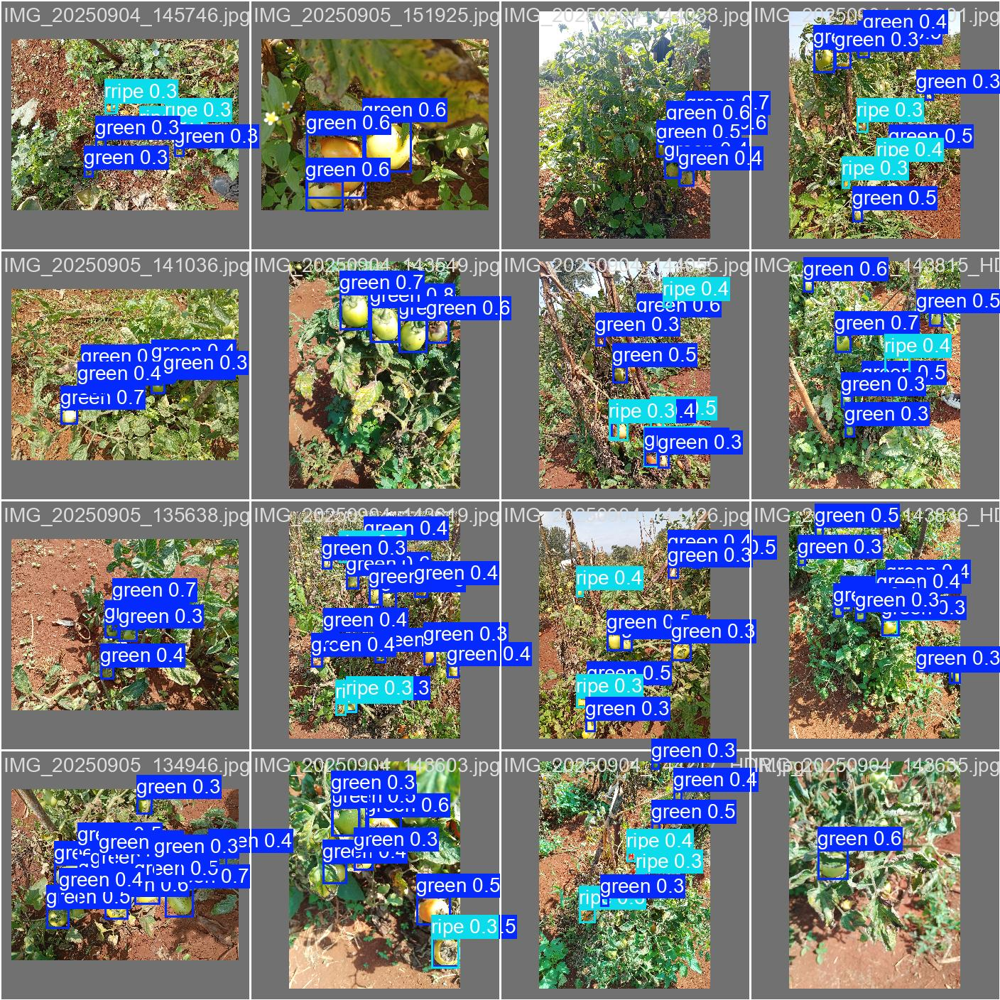


BoxPR_curve.png:


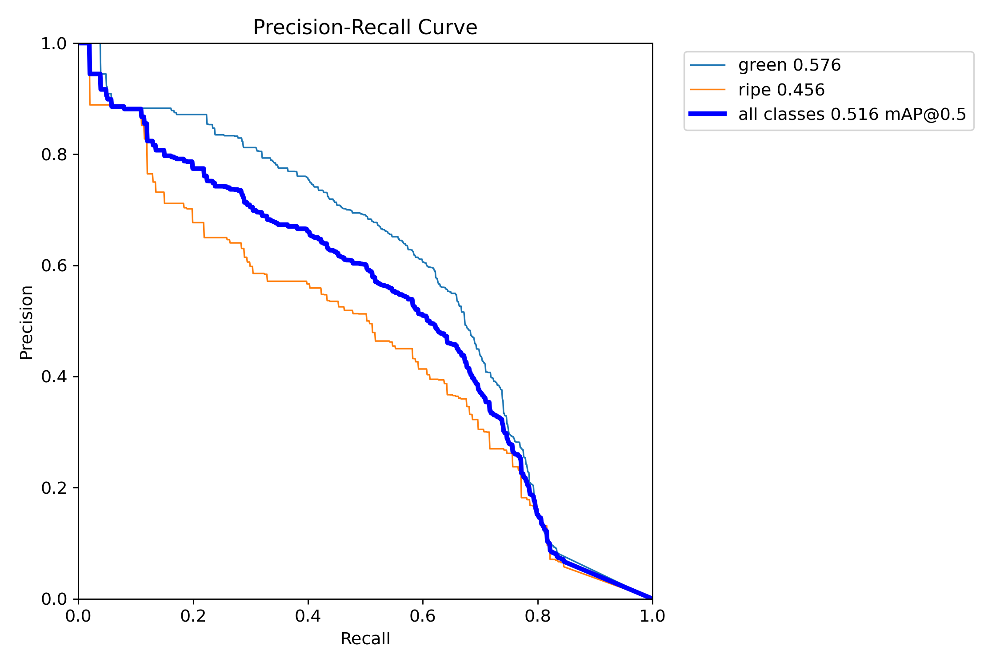


BoxF1_curve.png:


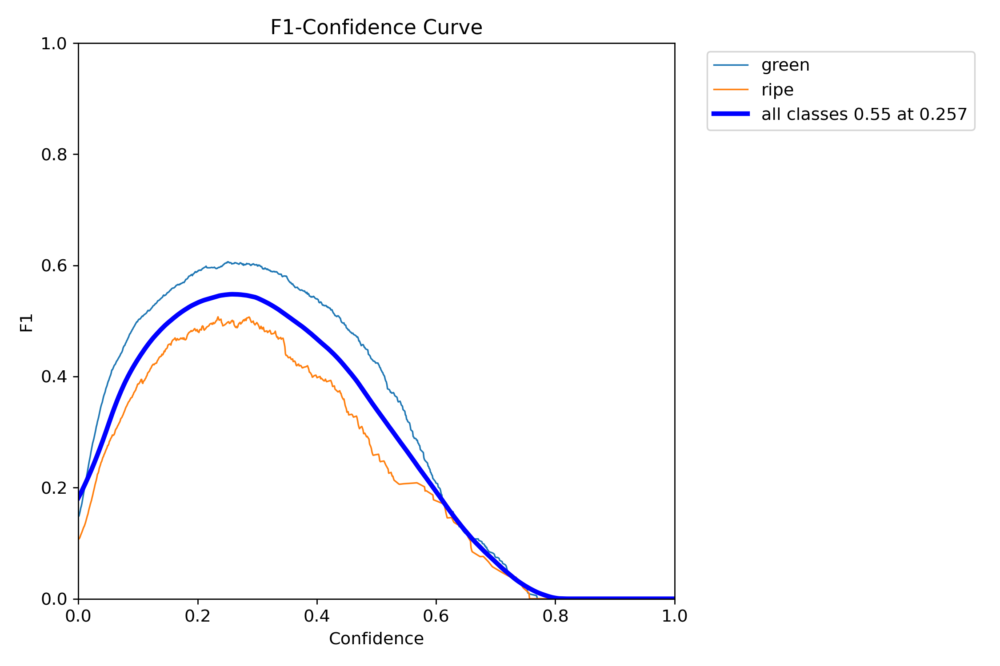


val_batch1_pred.jpg:


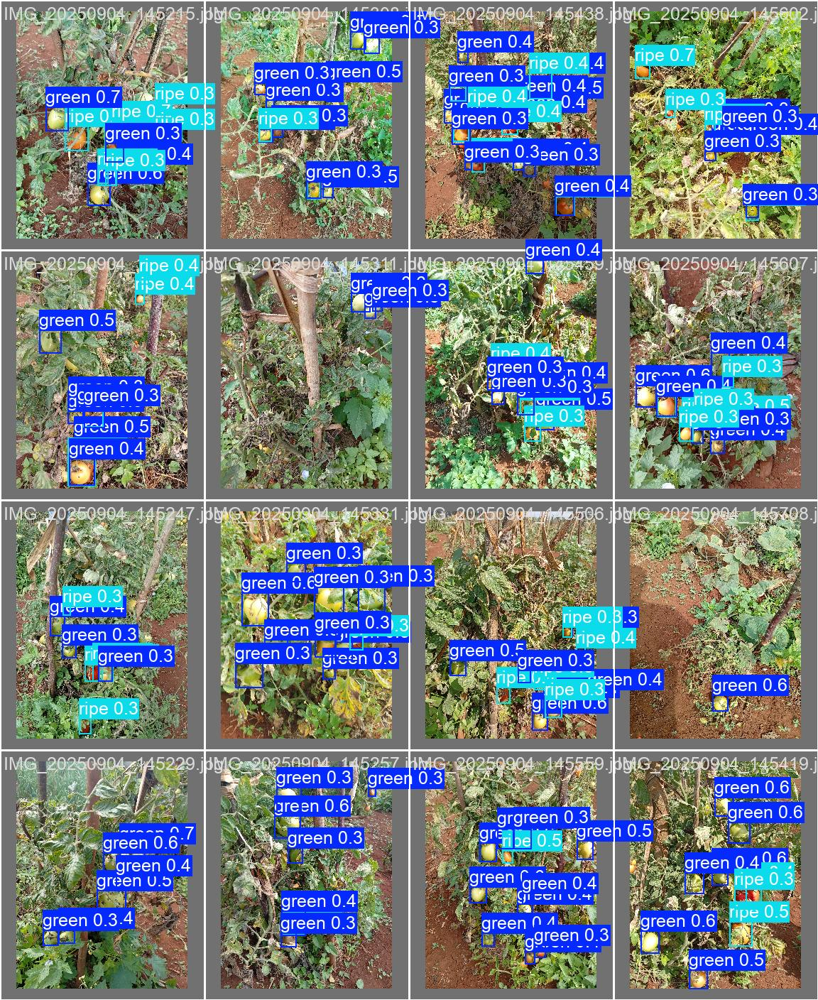


BoxR_curve.png:


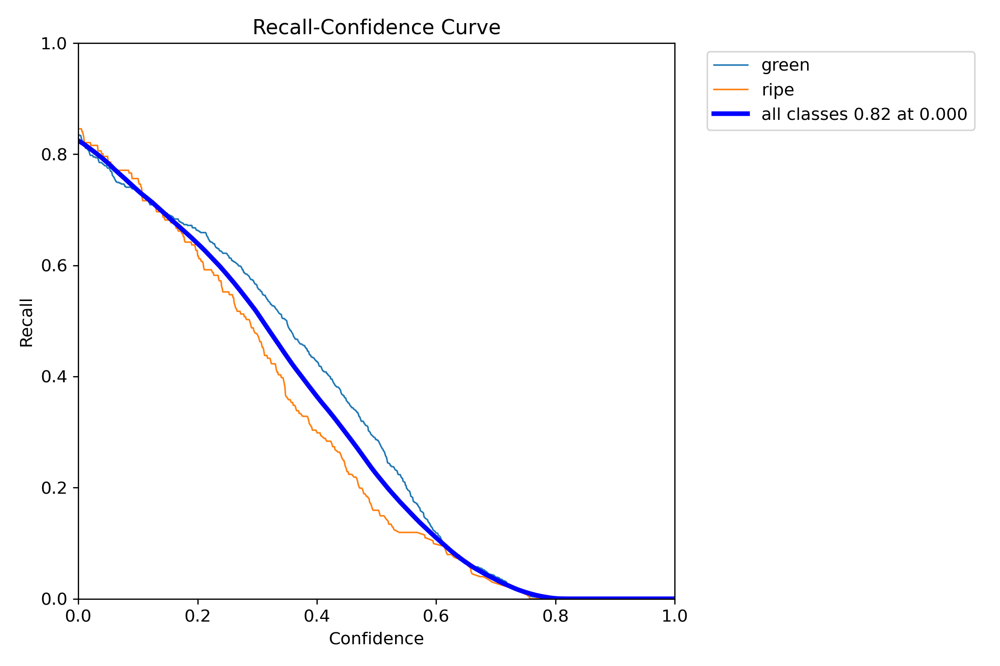


train_batch0.jpg:


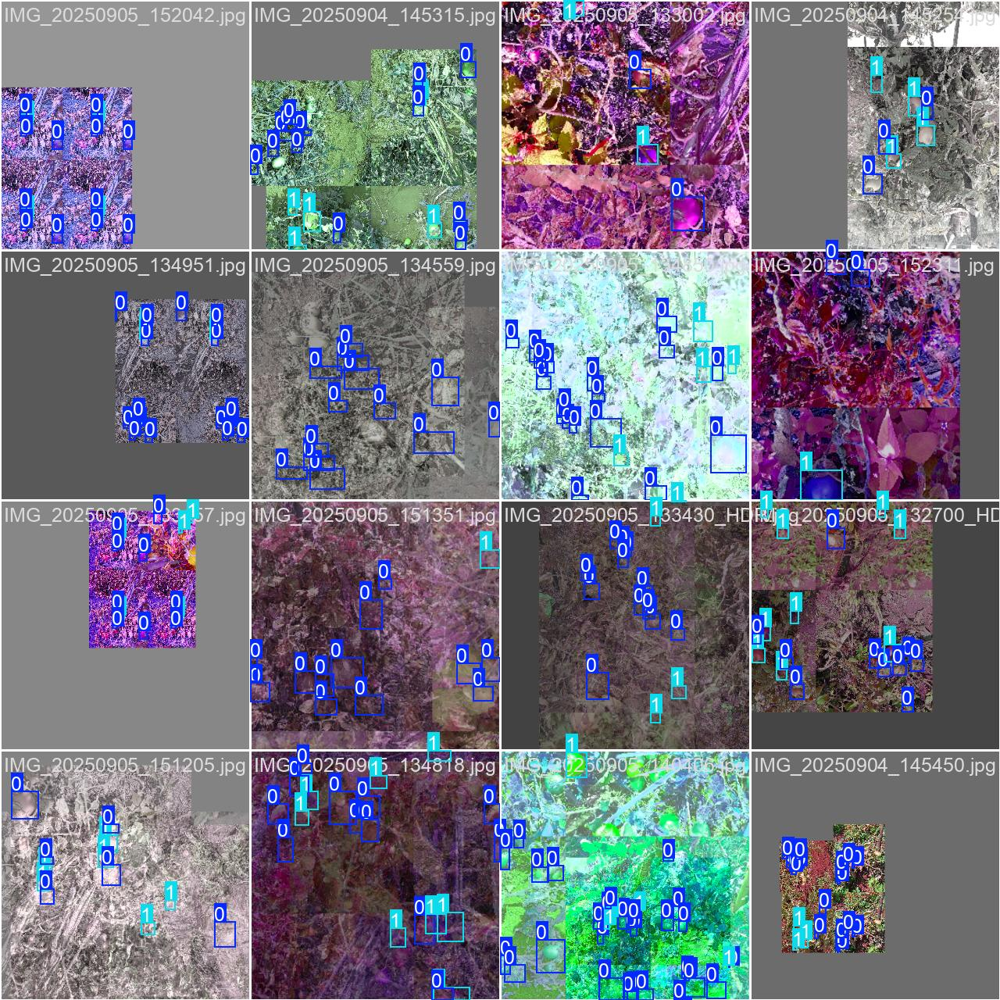


val_batch2_labels.jpg:


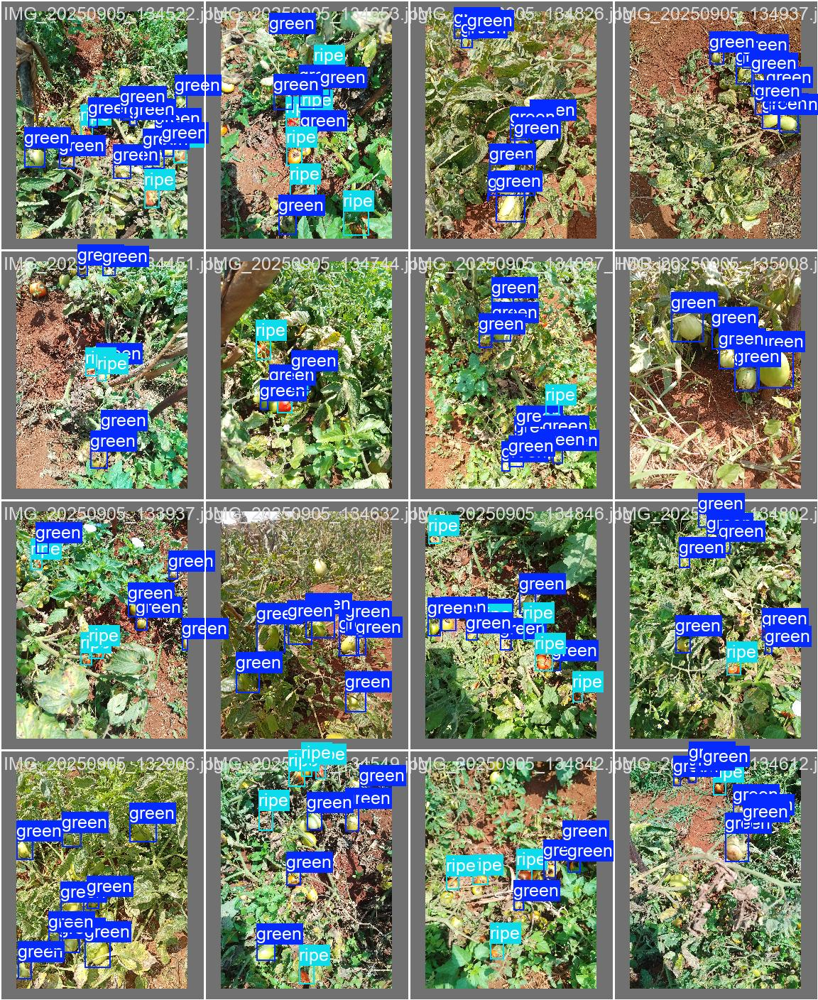


train_batch1162.jpg:


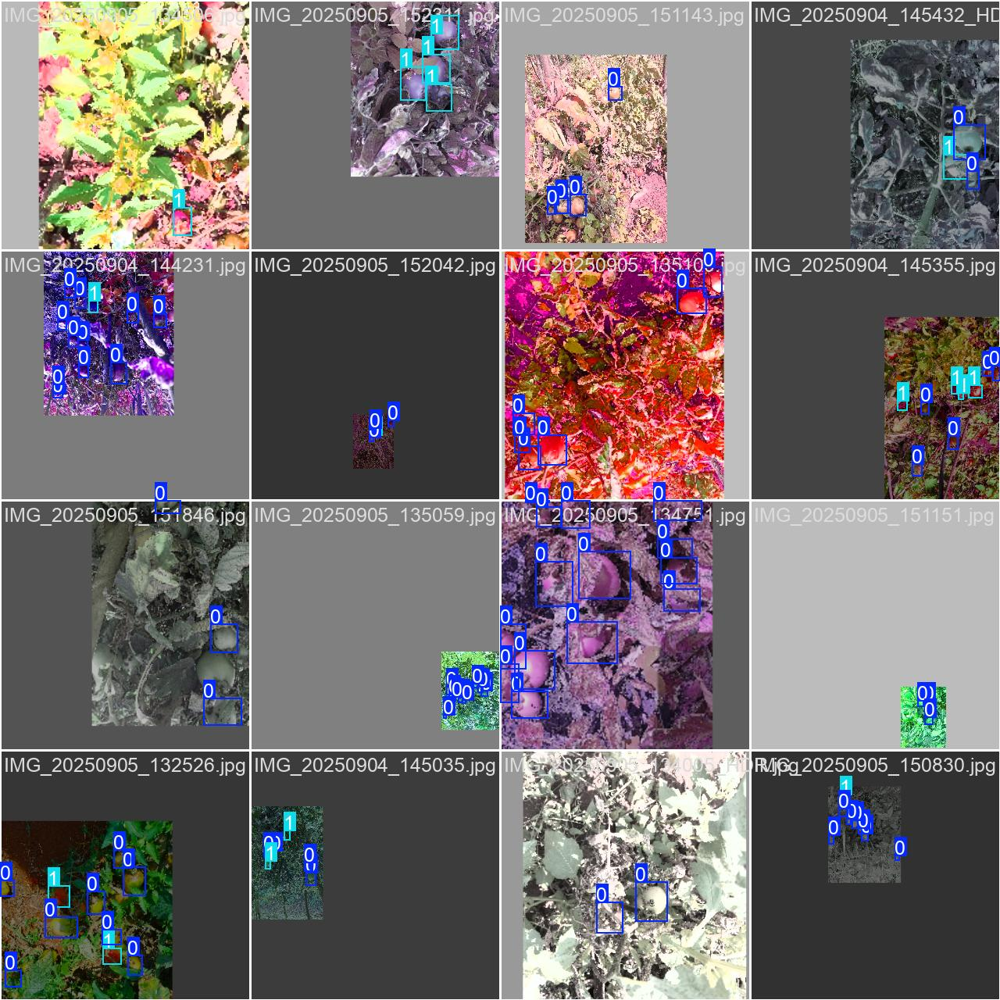


confusion_matrix_normalized.png:


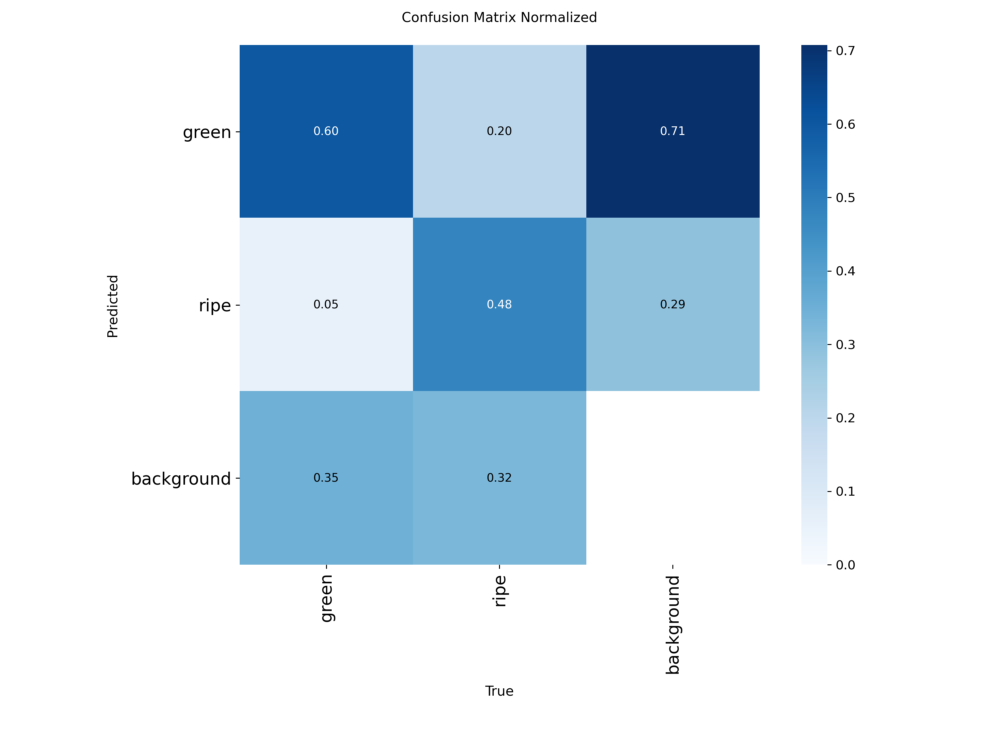


train_batch1160.jpg:


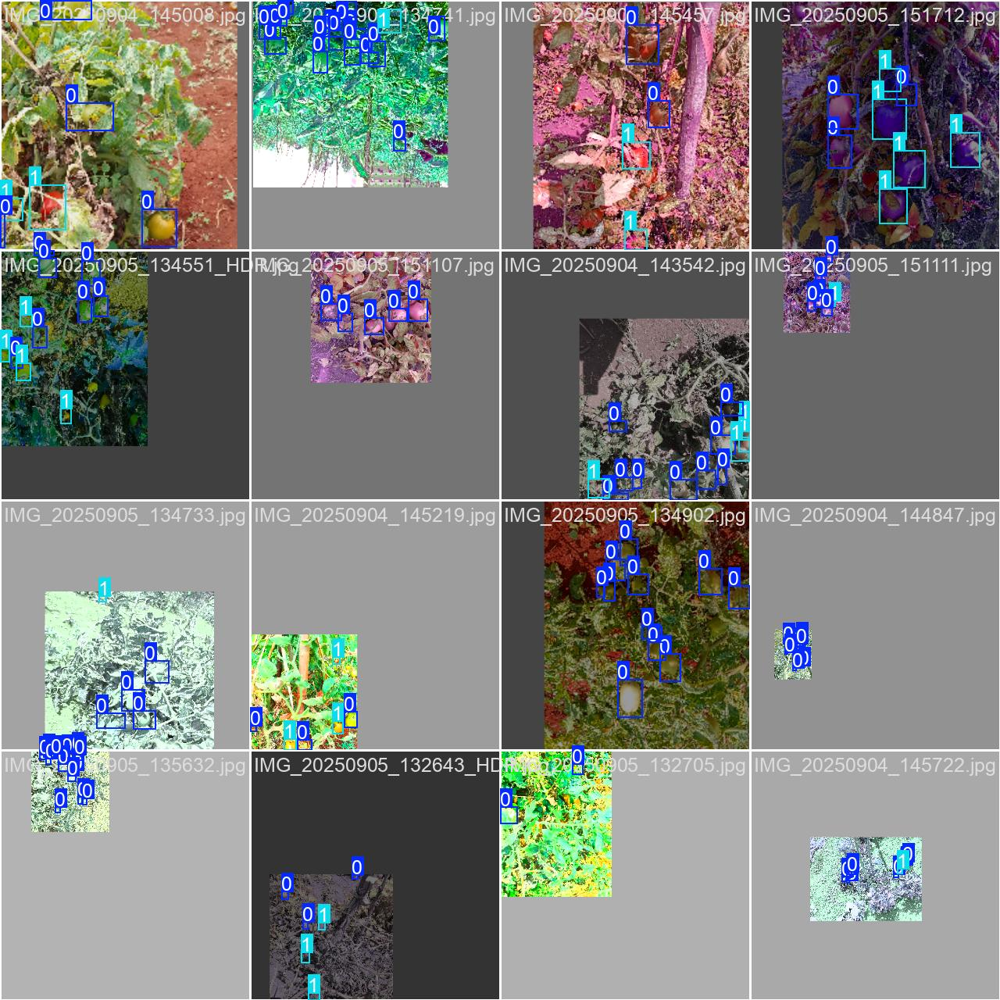


train_batch1.jpg:


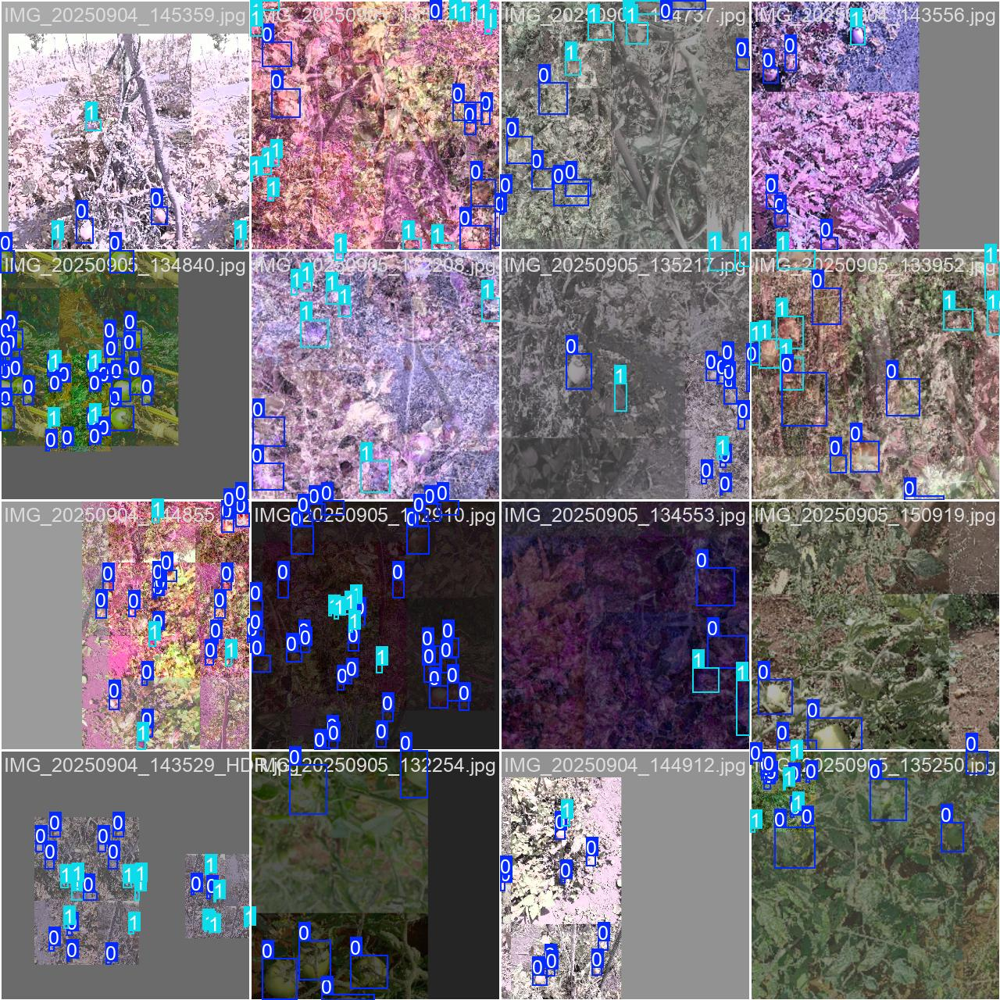


val_batch0_labels.jpg:


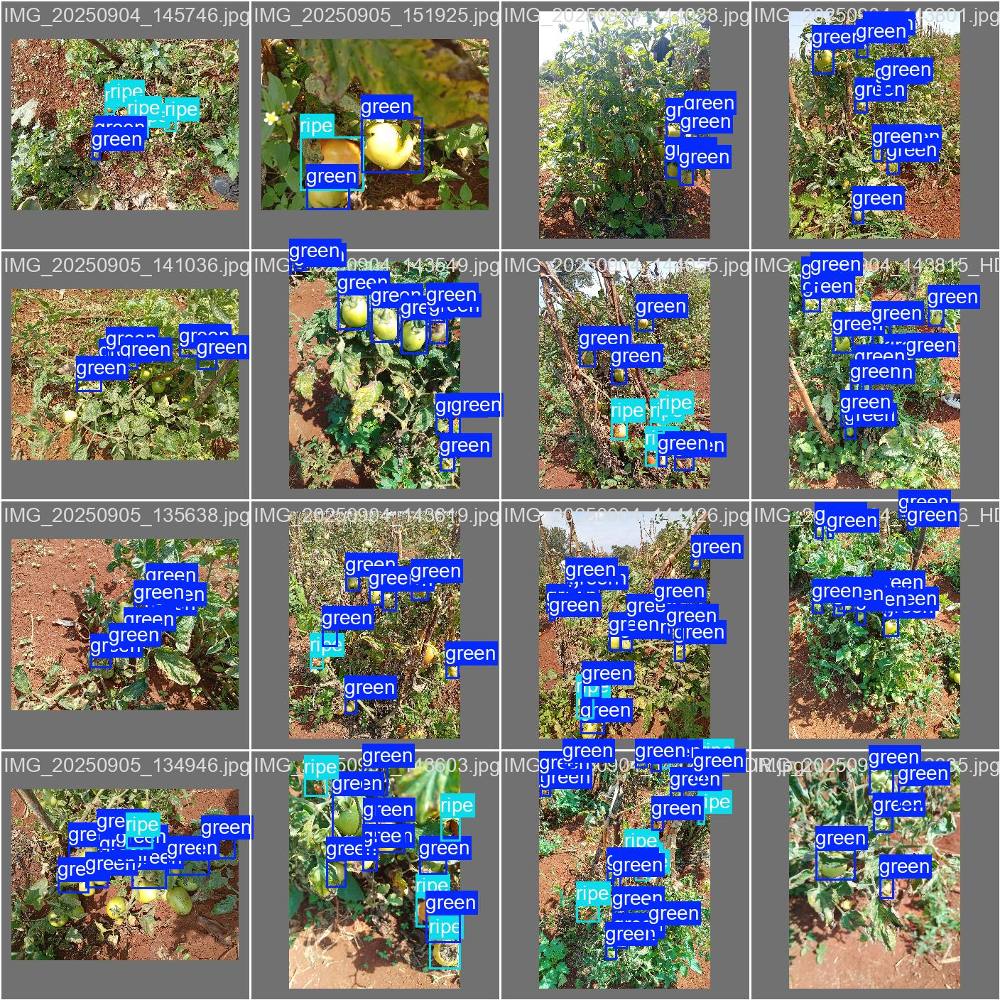


confusion_matrix.png:


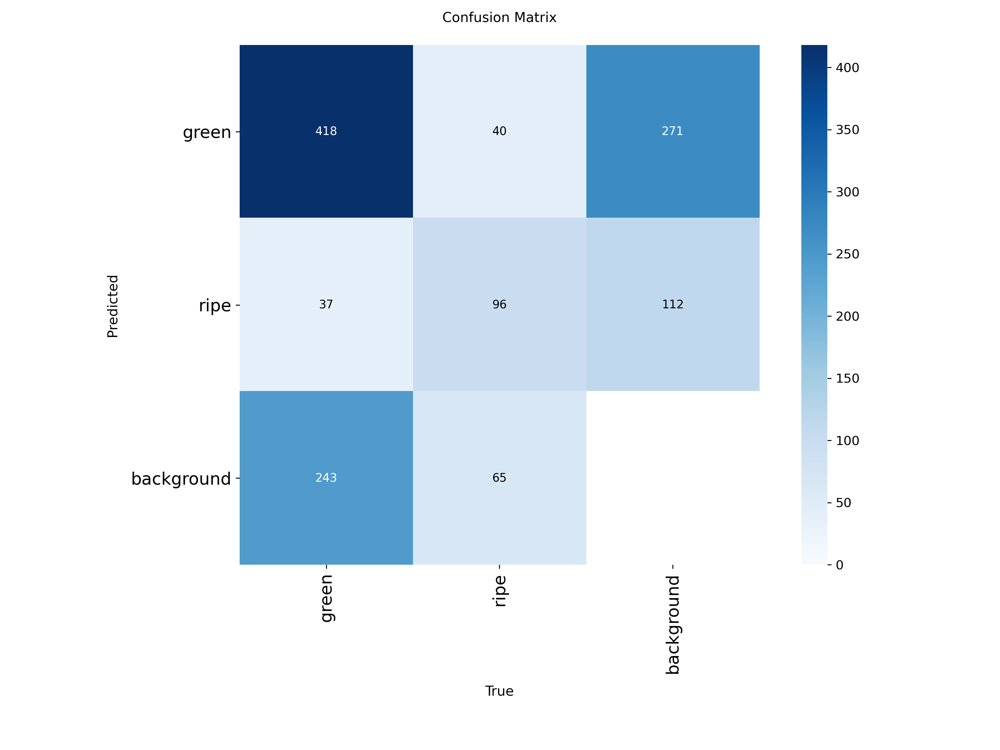


labels.jpg:


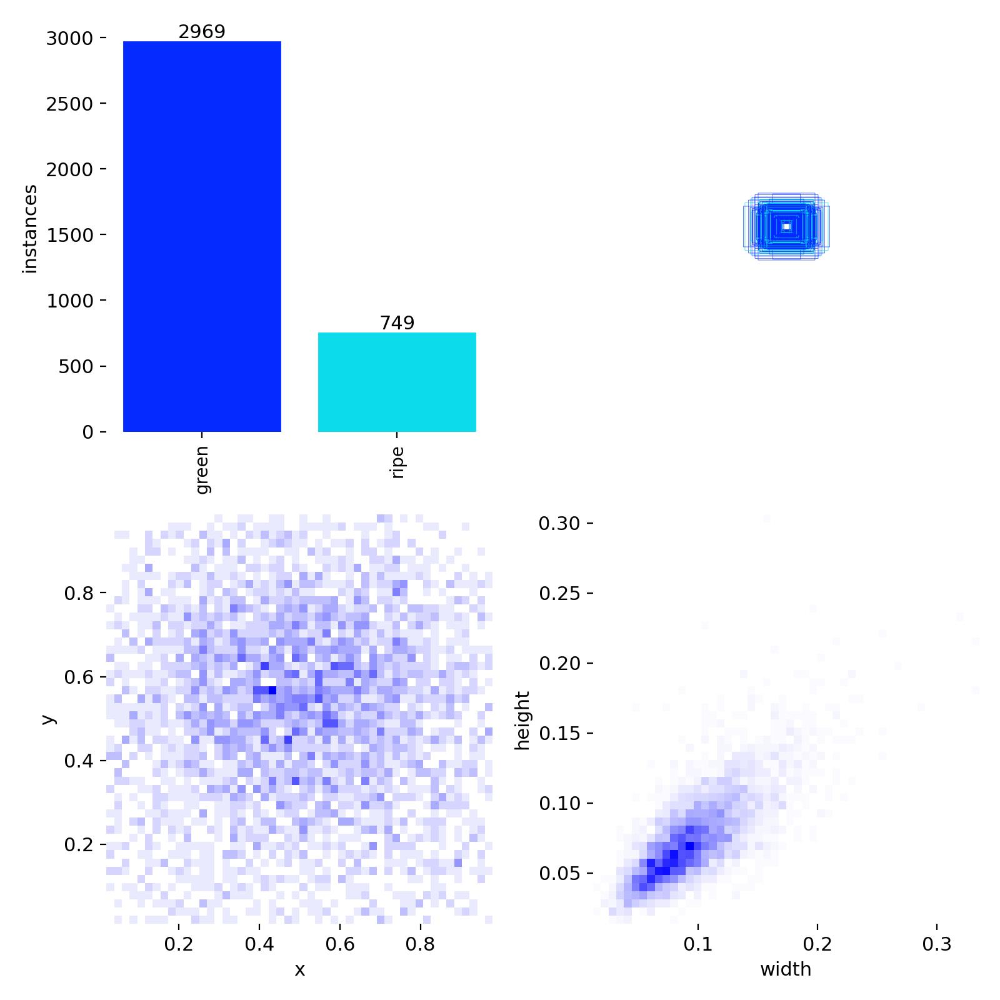


val_batch2_pred.jpg:


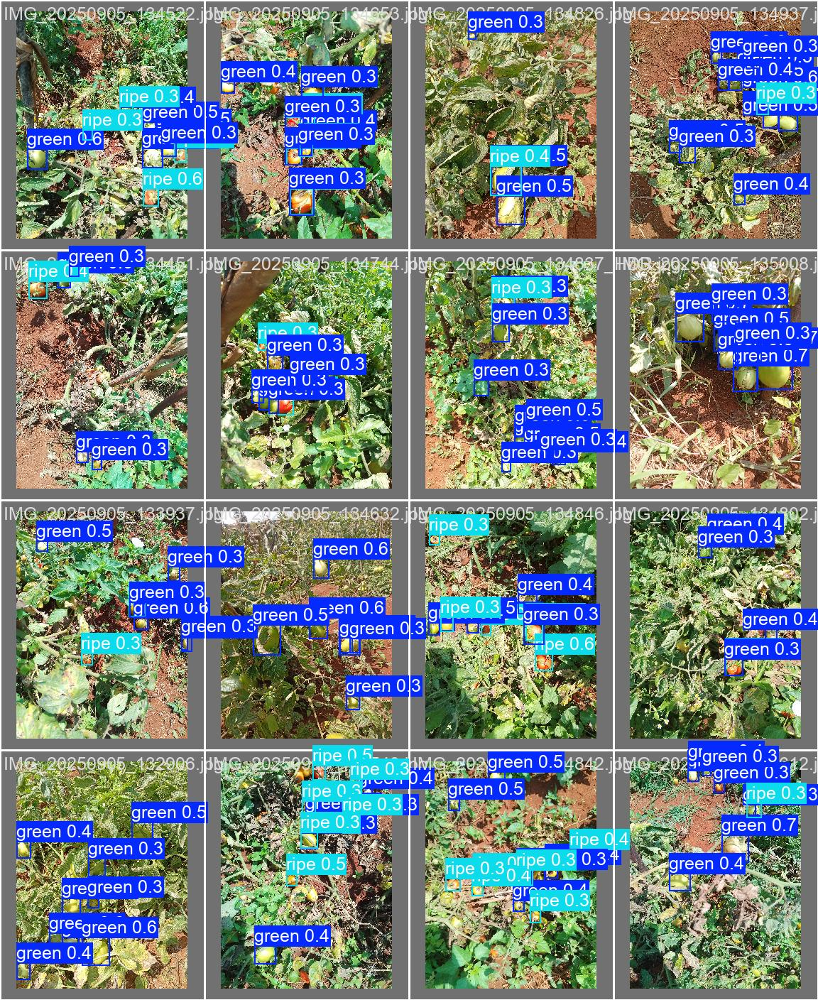


val_batch1_labels.jpg:


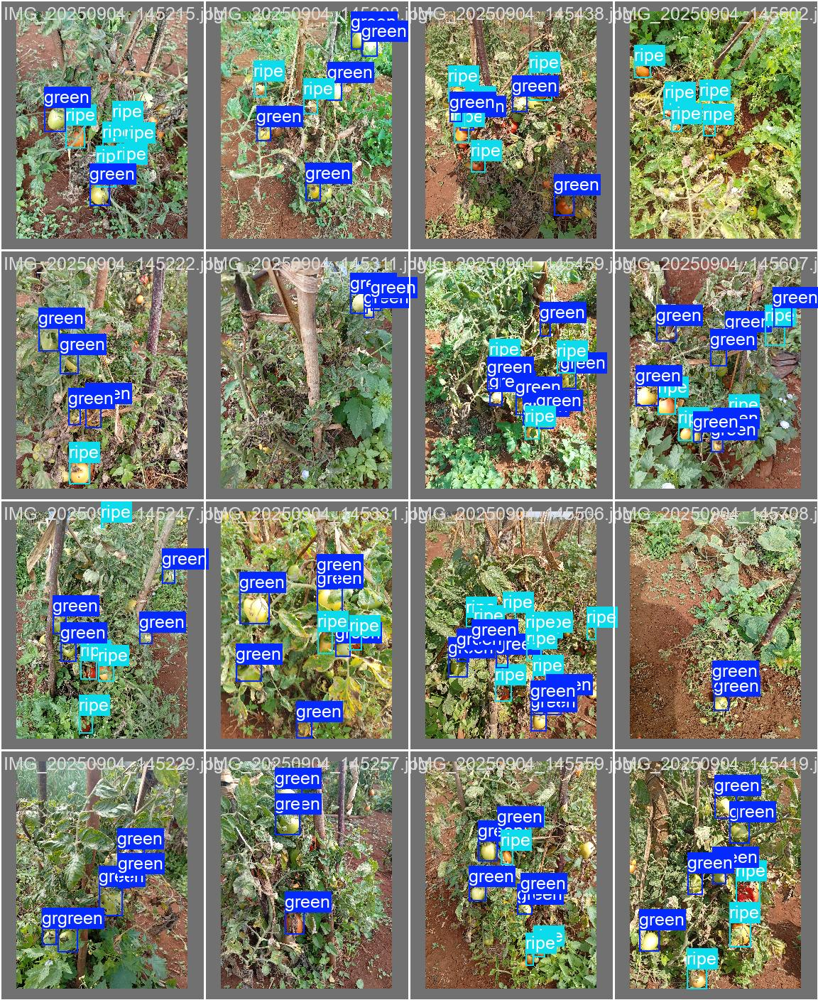


train_batch2.jpg:


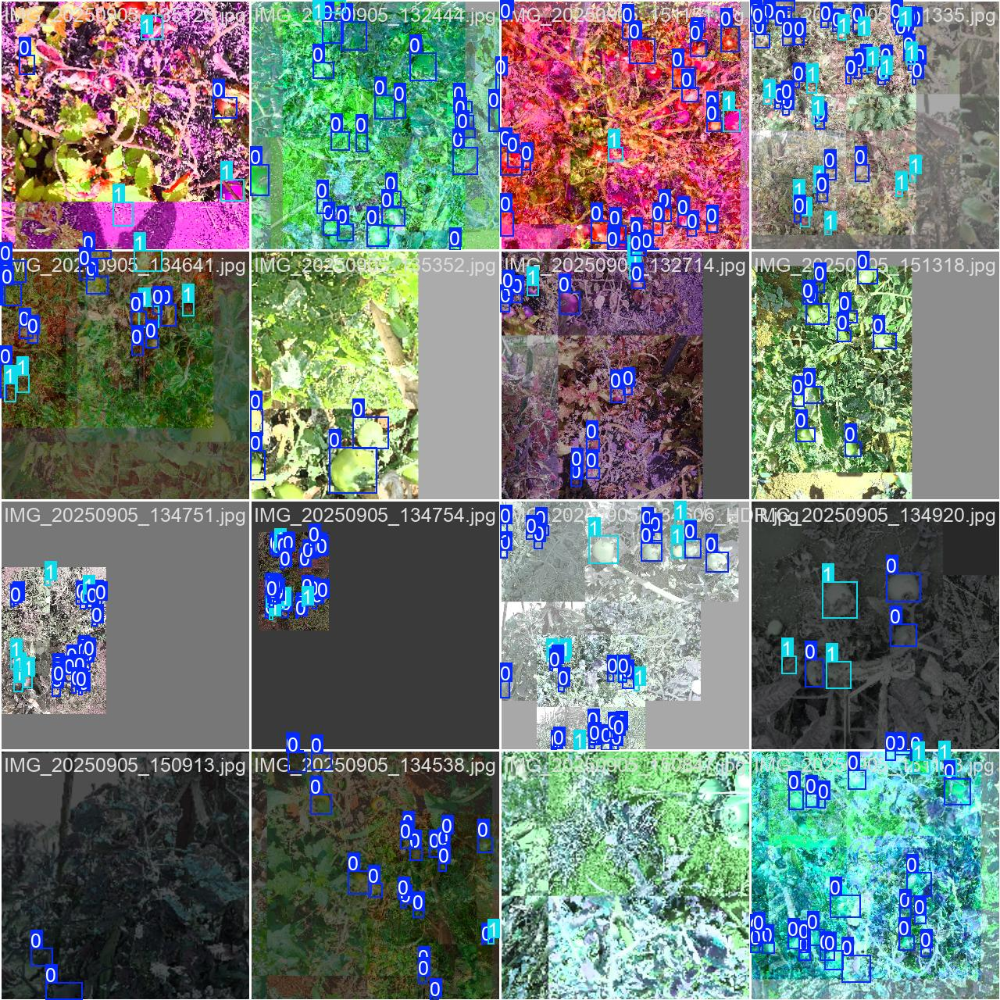

In [ ]:
from IPython.display import Image, display
import os

# Path
plots_dir = '/content/drive/MyDrive/Tomato_dataset/models/model.V2'

# Display all plots
for file in os.listdir(plots_dir):
    if file.endswith(('.png', '.jpg')):
        print(f"\n{file}:")
        display(Image(os.path.join(plots_dir, file)))